In [ ]:
project_name = 'Anime_Faces_GAN'

This project will be comprised of 2 neural networks: a Generator and a Discrimintor. The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs.

The Dataset used will be the Anime Face Dataset, which consists of over 63,000 cropped anime faces.

In [ ]:
# Download the dataset from kaggle
!pip install opendatasets --upgrade --quiet
{"username":"georgekalos","key":"327e840c02e5e09068a20cd2aaa79ecf"} # my user and key for kaggle

{'username': 'georgekalos', 'key': '327e840c02e5e09068a20cd2aaa79ecf'}

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/splcher/animefacedataset'
od.download(dataset_url)

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


In [ ]:
import os

DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [ ]:
print(os.listdir(DATA_DIR+'/images')[:10])

['4569_2003.jpg', '36443_2012.jpg', '9248_2004.jpg', '62175_2019.jpg', '32569_2011.jpg', '62086_2019.jpg', '11558_2005.jpg', '13990_2006.jpg', '17806_2007.jpg', '30542_2010.jpg']


Now I am going to load this dataset using the ImageFolder class from torchvision. I will also resize and crop the images to 64x64 px and normalize the pixel values with a mean and STD of 0.5 for each channel. This will ensure the pixel values are in the rane (-1, 1), which is more convenient for training the discriminator.

In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

Above I have created the Image folder with thedata directory and transforming the data by resizing, taking a center crop since some of the images might be rectangular, convert into tensors and normalize the the tensor values.

In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

This function takes the image tensor, multiplies it by a STD of 0,5 and adds the mean in order to denormalize it.

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

Show_images takes a bunch of image tensors, denormaliozes them and plots them in a grid.

Show_batch takes a data loader and show a batch of those images.

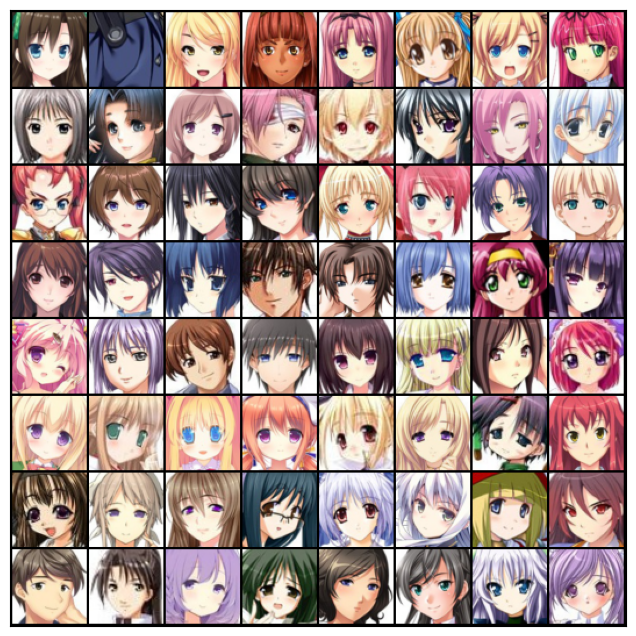

In [ ]:
show_batch(train_dl)

In [ ]:
# Gpu Stuff

def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
# Now I will move my training data loader using DeviceDataLoader to automatically transfer batches of data to the GPU
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network

The discriminator will take an image as an input and try to classify it as "real" of "generated". I will use a convolutional neural network (CNN) and output a single number for each image.

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

I'll breifly explain the model, first we have a convolutional layer going from 3 channels to 64 channels, using a kernel size of 4 and and a stride of 2. The stride of 2 in the convolution means that it will use every second pixel to place the color, that is why the image size reduces to half. 

The kernel size of 4 is to make sure that we are covering all the pixels properly. 

There is also a batch normalization layer and an activation function. The activation for the discriminator is the Leaky ReLu. This is used to multiply the negative values by 0.2 in order to train the model properly. Since we are using the descriminator as part of the loss function to train the generator, ReLu will lead to a lot of outputs from the generator being lost. So Leaky ReLu allows the pass of a smallgradient signal, even with negative values. That makes the gradients from the discriminator flow better into the generator. We basically want to make sure that once an image is generated from the generator, none of the information is lost when we are passing it through the discriminator and using the loss function to train the generator.  

The next convolutional layers are for the different specific channel transformations.

The sigmoid function reduces numbers into a 0-1 range, negative numbers end up in the range 0-0.5, positive numbers in the range 0.5-1. This is done to interpret the output of the discriminator as the probability that the image passed is a real image and not a generated one.

In [ ]:
# Finally I'll move the discriminator model to the GPU
discriminator = to_device(discriminator, device)

# Generator Network

The input to the generator is going to be a letent tensor used as a seed for generating an image. The generator will convert this latent tensor of shpe 128 x 1 x 1 into an image tensor of shape 3 x 28 x 28.

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

I am using the TanH activation function which reduces values into the range -1 to 1. This way the images picked from the dataset after normalization have pixel intensities within the range -1 to 1 and are of shape 3x64x64 and images generated from the generator after going through the TanH activation will also have pixel intensities within the range -1 to 1 and shape 3x64x64. This way the generator is going to generate images that have the same ranges of pixel intensities as the discriminator.

torch.Size([128, 3, 64, 64])


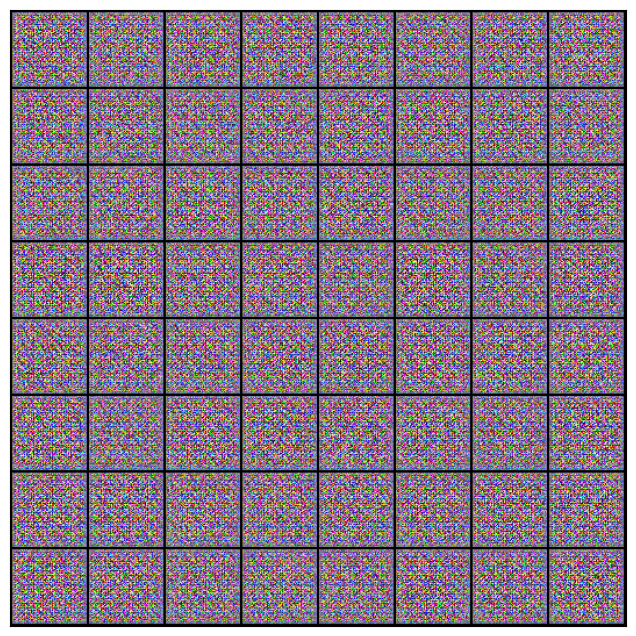

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

Since the generator has not been trained yet it's just outputting random noise. Next step is to train the dicriminator, then the generator.

In [ ]:
# I'll move the generator to device as well
generator = to_device(generator, device)

# Discriminator training

Since the discriminator is a binary classification model, I'll use the binary cross entropy loss function to see how well it differentiates between real and generated images

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Steps taken to train the descriminator:
1. Expect the discriminator to output 1 for real images and 0 for generated images
2. Pass a batch of real images, compute the loss, set the target labels to 1
3. Pass a batch of generated images, compute the loss, set the target labels to 0
4. Add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator

# Generator Training

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Steps taken to train the generator
1. Generate a batch of images using the generator, pass them into the discriminator
2. Calculate the loss by setting the target labels to 1. This is done to with the objective to "fool" the discriminator.
3. Use the loss to perform gradient descent and change the weights of the generator. It gets better at "fooling" the discriminator

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


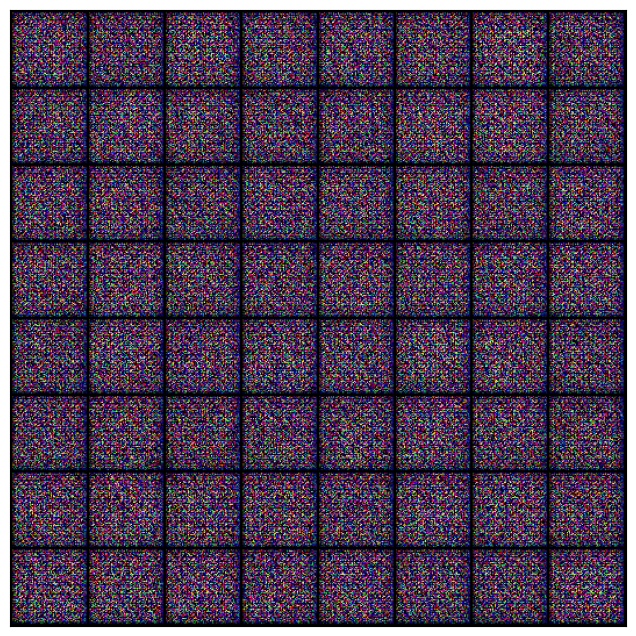

In [ ]:
save_samples(0, fixed_latent)

# Training loop

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 50

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/50], loss_g: 3.5877, loss_d: 0.5379, real_score: 0.8233, fake_score: 0.2395
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/50], loss_g: 5.6633, loss_d: 0.4339, real_score: 0.8748, fake_score: 0.2338
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/50], loss_g: 6.1291, loss_d: 0.3301, real_score: 0.8793, fake_score: 0.1614
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/50], loss_g: 6.6389, loss_d: 0.3644, real_score: 0.8994, fake_score: 0.2015
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/50], loss_g: 4.4657, loss_d: 0.2723, real_score: 0.8785, fake_score: 0.1099
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/50], loss_g: 6.2049, loss_d: 0.3555, real_score: 0.7482, fake_score: 0.0065
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/50], loss_g: 6.7110, loss_d: 0.2742, real_score: 0.9885, fake_score: 0.2114
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/50], loss_g: 6.0732, loss_d: 0.2121, real_score: 0.8535, fake_score: 0.0164
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/50], loss_g: 4.2353, loss_d: 0.0881, real_score: 0.9782, fake_score: 0.0600
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/50], loss_g: 5.9329, loss_d: 0.0495, real_score: 0.9714, fake_score: 0.0184
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/50], loss_g: 4.3499, loss_d: 0.1634, real_score: 0.9088, fake_score: 0.0436
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/50], loss_g: 4.5015, loss_d: 0.2038, real_score: 0.9078, fake_score: 0.0865
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/50], loss_g: 3.6742, loss_d: 0.1920, real_score: 0.8800, fake_score: 0.0422
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/50], loss_g: 4.6315, loss_d: 0.0611, real_score: 0.9653, fake_score: 0.0237
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/50], loss_g: 5.2999, loss_d: 0.1327, real_score: 0.9591, fake_score: 0.0774
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/50], loss_g: 4.7304, loss_d: 0.1267, real_score: 0.9422, fake_score: 0.0597
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/50], loss_g: 5.3707, loss_d: 0.1496, real_score: 0.9720, fake_score: 0.0998
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/50], loss_g: 4.4053, loss_d: 0.1846, real_score: 0.9542, fake_score: 0.1075
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/50], loss_g: 3.5722, loss_d: 0.3871, real_score: 0.7221, fake_score: 0.0039
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/50], loss_g: 3.9060, loss_d: 0.1773, real_score: 0.9014, fake_score: 0.0585
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/50], loss_g: 4.3352, loss_d: 0.1226, real_score: 0.9115, fake_score: 0.0194
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/50], loss_g: 5.1066, loss_d: 0.0839, real_score: 0.9734, fake_score: 0.0520
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/50], loss_g: 5.7912, loss_d: 0.2374, real_score: 0.9686, fake_score: 0.1604
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/50], loss_g: 2.3979, loss_d: 0.2171, real_score: 0.8470, fake_score: 0.0192
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/50], loss_g: 5.6941, loss_d: 0.1318, real_score: 0.9890, fake_score: 0.0961
Saving generated-images-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/50], loss_g: 6.0509, loss_d: 0.0724, real_score: 0.9431, fake_score: 0.0081
Saving generated-images-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/50], loss_g: 4.2563, loss_d: 0.1212, real_score: 0.9470, fake_score: 0.0548
Saving generated-images-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/50], loss_g: 1.4302, loss_d: 1.0078, real_score: 0.4490, fake_score: 0.0015
Saving generated-images-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/50], loss_g: 4.8921, loss_d: 0.0613, real_score: 0.9678, fake_score: 0.0257
Saving generated-images-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/50], loss_g: 5.7992, loss_d: 0.1136, real_score: 0.9872, fake_score: 0.0864
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/50], loss_g: 4.9734, loss_d: 0.1435, real_score: 0.9517, fake_score: 0.0767
Saving generated-images-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/50], loss_g: 8.1066, loss_d: 0.3237, real_score: 0.9861, fake_score: 0.2160
Saving generated-images-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/50], loss_g: 5.3771, loss_d: 0.1035, real_score: 0.9621, fake_score: 0.0579
Saving generated-images-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/50], loss_g: 4.6880, loss_d: 0.0447, real_score: 0.9828, fake_score: 0.0257
Saving generated-images-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/50], loss_g: 5.0874, loss_d: 0.0641, real_score: 0.9614, fake_score: 0.0227
Saving generated-images-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/50], loss_g: 3.6204, loss_d: 0.1406, real_score: 0.9227, fake_score: 0.0474
Saving generated-images-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/50], loss_g: 2.4667, loss_d: 0.2167, real_score: 0.8685, fake_score: 0.0432
Saving generated-images-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/50], loss_g: 5.7528, loss_d: 0.0816, real_score: 0.9870, fake_score: 0.0566
Saving generated-images-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/50], loss_g: 4.8986, loss_d: 0.2207, real_score: 0.9941, fake_score: 0.1599
Saving generated-images-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/50], loss_g: 6.6486, loss_d: 0.0867, real_score: 0.9970, fake_score: 0.0728
Saving generated-images-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/50], loss_g: 4.0005, loss_d: 0.0668, real_score: 0.9561, fake_score: 0.0179
Saving generated-images-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/50], loss_g: 5.0043, loss_d: 0.0608, real_score: 0.9694, fake_score: 0.0273
Saving generated-images-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/50], loss_g: 5.7186, loss_d: 0.0710, real_score: 0.9559, fake_score: 0.0201
Saving generated-images-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/50], loss_g: 3.1010, loss_d: 0.3369, real_score: 0.8576, fake_score: 0.1244
Saving generated-images-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/50], loss_g: 4.5053, loss_d: 0.0805, real_score: 0.9378, fake_score: 0.0094
Saving generated-images-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/50], loss_g: 5.5063, loss_d: 0.0382, real_score: 0.9769, fake_score: 0.0135
Saving generated-images-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/50], loss_g: 5.8900, loss_d: 0.0258, real_score: 0.9934, fake_score: 0.0181
Saving generated-images-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/50], loss_g: 3.0587, loss_d: 0.1091, real_score: 0.9791, fake_score: 0.0774
Saving generated-images-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/50], loss_g: 4.7176, loss_d: 0.0402, real_score: 0.9732, fake_score: 0.0116
Saving generated-images-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/50], loss_g: 5.6634, loss_d: 0.0656, real_score: 0.9848, fake_score: 0.0457
Saving generated-images-0050.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'Generator_checkpoint.pth')
torch.save(discriminator.state_dict(), 'Discriminator_checkpoint.pth')

In [ ]:
# Save Model
torch.save(generator, 'generator.pth')

In [ ]:
torch.save(discriminator, 'discriminator.pth')

In [ ]:
from IPython.display import Image

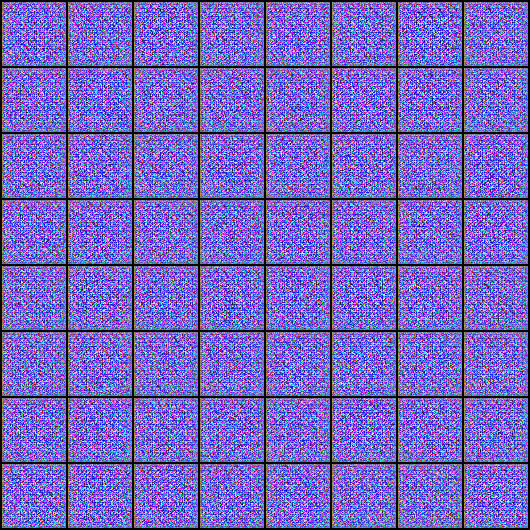

In [ ]:
Image('./generated/generated-images-0000.png')

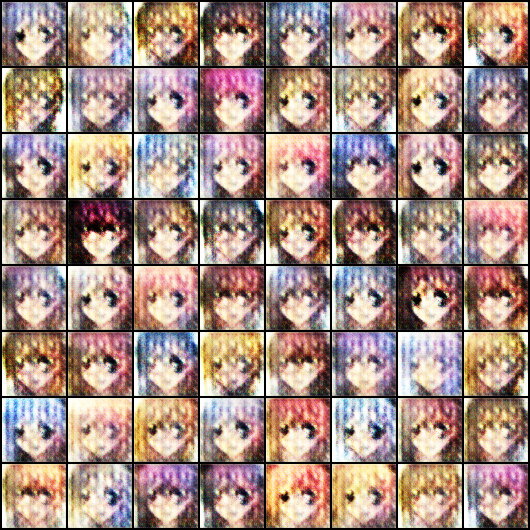

In [ ]:
Image('./generated/generated-images-0001.png')

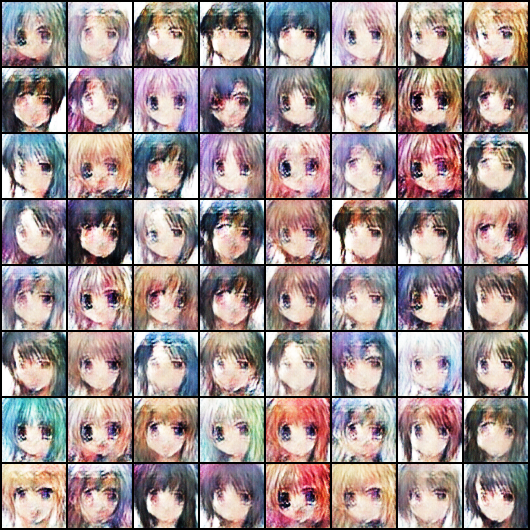

In [ ]:
Image('./generated/generated-images-0005.png')

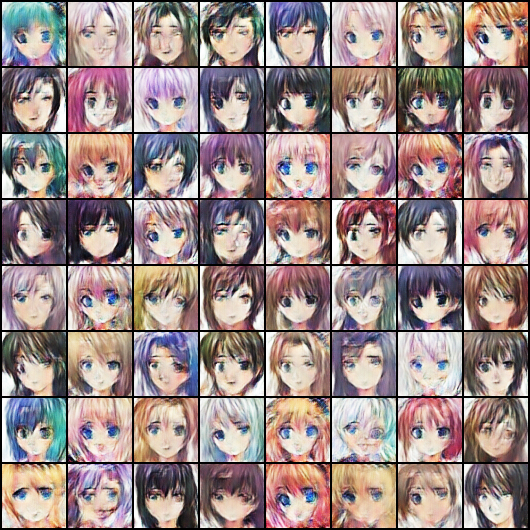

In [ ]:
Image('./generated/generated-images-0010.png')

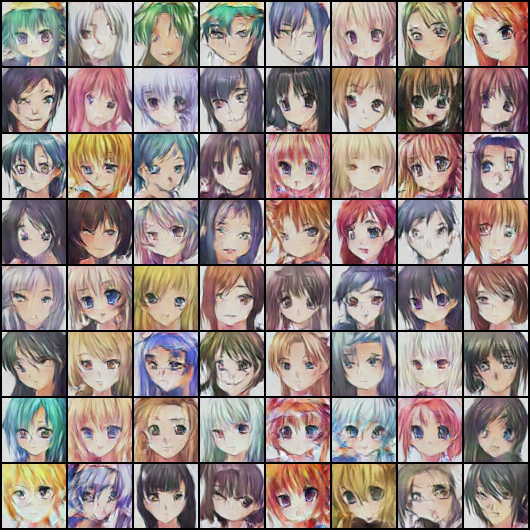

In [ ]:
Image('./generated/generated-images-0020.png')

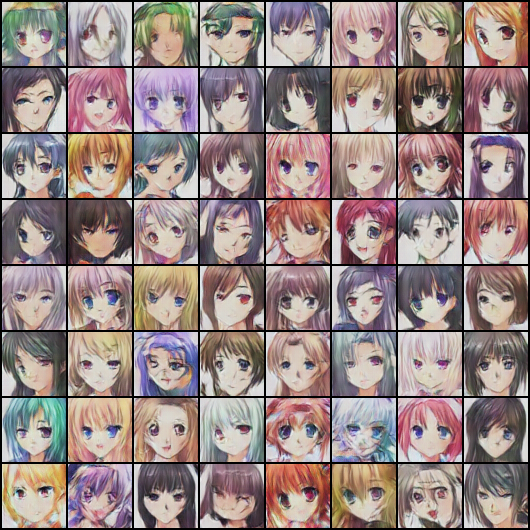

In [ ]:
Image('./generated/generated-images-0025.png')

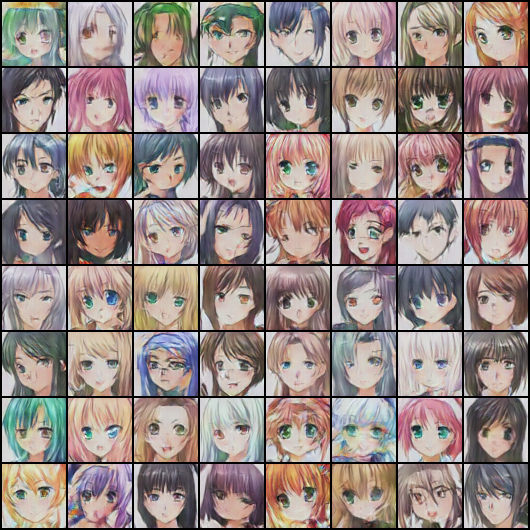

In [ ]:
Image('./generated/generated-images-0030.png')

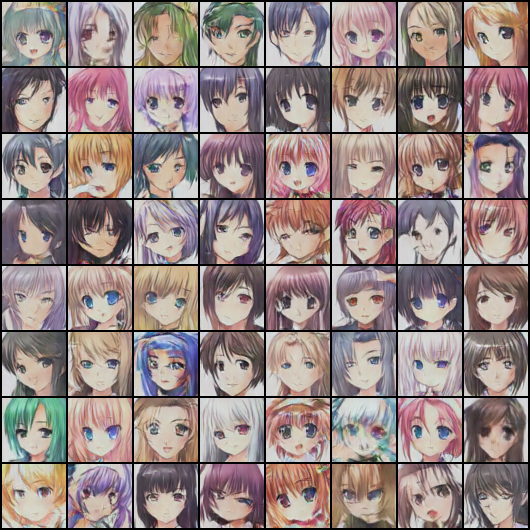

In [ ]:
Image('./generated/generated-images-0050.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

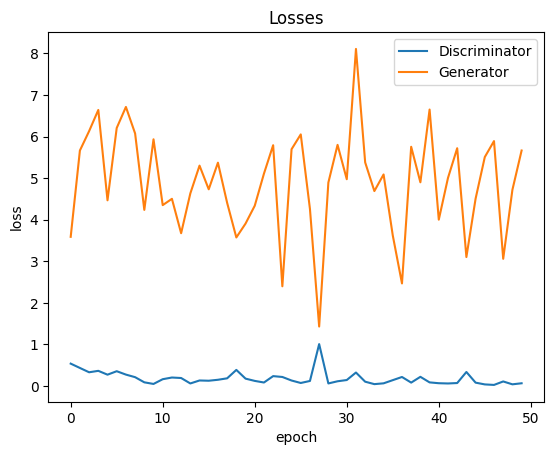

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

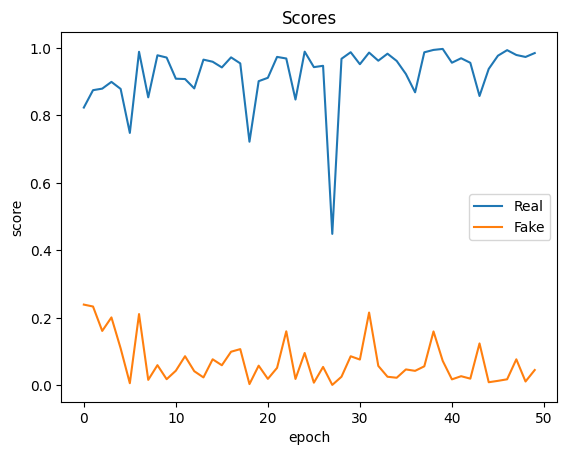

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');